# TUTORIAL 3: traffic components and their display; with a stop street example

_________________________________________________________________________________

# Overview
In this tutorial, we introduce the concept of traffic components as well as how to view their progress. Our focus will be on one of the most simple components - the stop street. Subequent tutorials on traffic components will follow a similar recipe as introduced here and will be much more brief.

We take this moment to discuss the fact that this tutorial is presented in a Jupyter Notebook. The display components in `__basik__` use a Matplotlib (Python's standard scientific visualisation library) backend known as 'QtA5gg'. Using this backend on a Jupyter Notebook causes it to fail. The display components can be run in an Ipython Console or an IDE such as Spyder. We will thus be presenting the code required to produce the display component of the simulation but we will refrain from executing it. Instead we will rather play a `mp4` clip of the simulation that was produced from running the display component in a Spyder IDE (it uses IPython with QtA5gg). These clips can be reproduced by running the scripts in `/Basik_Tutorial/Console_Scripts`. 

Furthermore, it is a well known fact that not all `mp4` videos are the same. This issue pops up in many modern HTML5 browsers. The Google Chrome browser seems to be the most proficient in running all types of videos. The same cannot be said for the FireFox browser. Running this tutorial in a FireFox browser might lead to the videos not playing. Using Google Chrome is reccommended.

In [1]:
import __basik__ as bk

/home/dylan/Documents/Basik_Tutorial/__basik__/__init__.py:37: UserWarning: __basik__ has picked up that it is currently being run from within a Ipython or Jupyter Notebook. Display components requireQtA5gg to render. Most Ipython-based interactive notebooks havetheir kernel shut down when using QtA5gg as a Matplotlib backend. Hence, __basik__ will not use QtA5gg. As a result, please refrain from using __basik__ display components while in the Ipython or Jupyter Notebook environment. If display components are required, please use Ipython in a console. The Spyder IDE for Python is highly recommended.
  warnings.warn(message)


Importing matplotlib.pyplot as plt



## An active stop street
We will be creating a four-way stop street. This is the most traditional version of the stop street. `__basik__` does however allow for different configurations to be set up. The only restriction is that a maximum of four lanes may be connected and a minimum of two. These may be connected in any combination by allocating it a direction (North,East,South,West).

For a four-way stop street, we will require four vehicle sources. We will require four lanes feeding into the stop street and four lanes allowing vehicles to exit from the stop street. A pair of parallel lanes with opposite flow forms the traditional urban road that we are accustomed to.


In [2]:
print('Setting up simulation...')
import numpy as np
np.random.seed(123)
end_time = 200
lane_length = 30
bk.Queue.clear()
# We will create 4 roads: each with a pair of lanes containing opposing flow
# North:
Nlane_in = bk.Lane(lane_length) # flows into the stop street
Nlane_out = bk.Lane(lane_length) # flows out of the stop street
Nrate = {end_time:bk.Rate(0.1)} # a vehicle arrives every 10 seconds
Nsource = bk.Source(vehicle_velocity = 16.67,  # 60 km/h
                    target_node = Nlane_in.IN,
                    rate_schedule=Nrate)
print('Scheduling Northern arrivals...')
Nsource.setup_arrivals(end_time)
print('..done!')
Nrecord = bk.Record(Nlane_out.OUT)  # record at last node of the lane flowing outwards
# East 
Elane_in = bk.Lane(lane_length) # flows into the stop street
Elane_out = bk.Lane(lane_length) # flows out of the stop street
Erate = {end_time:bk.Rate(0.05)} # a vehicle arrives every 20 seconds
Esource = bk.Source(vehicle_velocity = 16.67,  # 60 km/h
                    target_node = Elane_in.IN,
                    rate_schedule=Erate)
print('Scheduling Eastern arrivals...')
Esource.setup_arrivals(end_time)
print('..done!')
Erecord = bk.Record(Elane_out.OUT)  # record at last node of the lane flowing outwards
# South
Slane_in = bk.Lane(lane_length) # flows into the stop street
Slane_out = bk.Lane(lane_length) # flows out of the stop street
Srate = {end_time:bk.Rate(0.1)} # a vehicle arrives every 10 seconds
Ssource = bk.Source(vehicle_velocity = 16.67,  # 60 km/h
                    target_node = Slane_in.IN,
                    rate_schedule=Srate)
print('Scheduling Southern arrivals...')
Ssource.setup_arrivals(end_time)
print('..done!')
Srecord = bk.Record(Slane_out.OUT)  # record at last node of the lane flowing outwards
# West
Wlane_in = bk.Lane(lane_length) # flows into the stop street
Wlane_out = bk.Lane(lane_length) # flows out of the stop street
Wrate = {end_time:bk.Rate(0.05)} # a vehicle arrives every 20 seconds
Wsource = bk.Source(vehicle_velocity = 16.67,  # 60 km/h
                    target_node = Wlane_in.IN,
                    rate_schedule=Wrate)
print('Scheduling Western arrivals...')
Wsource.setup_arrivals(end_time)
print('..done!')
Wrecord = bk.Record(Wlane_out.OUT)  # record at last node of the lane flowing outwards
# We now create the actual stop street object
# Below we create in node. Note: out nodes of the lane object are in nodes to a stop street object
# Generally, OUT flows into IN and IN flows towards OUT.
in_nodes = {'N':Nlane_in.OUT,'E':Elane_in.OUT,'S':Slane_in.OUT,'W':Wlane_in.OUT}
out_nodes = {'N':Nlane_out.IN,'E':Elane_out.IN,'S':Slane_out.IN,'W':Wlane_out.IN,}
# We create a transition probability matrix. It must be row stochastic!
transitions = {'N': {'E': 0.2, 'S': 0.6, 'W': 0.2},
               'E': {'S': 0.2, 'W': 0.6, 'N': 0.2},
               'S': {'W': 0.2, 'N': 0.6, 'E': 0.2},
               'W': {'N': 0.2, 'E': 0.6, 'S': 0.2}}
stopstreet = bk.StopStreet(in_nodes=in_nodes,
                           out_nodes=out_nodes,
                           transitions=transitions)
print('Simulation started...')
bk.Queue.run(end_time=end_time,
             start_time=0)
print('...done!')

Setting up simulation...
Scheduling Northern arrivals...
..done!
Scheduling Eastern arrivals...
..done!
Scheduling Southern arrivals...
..done!
Scheduling Western arrivals...
..done!
Simulation started...
...done!


We can view what happened via the record objects.

<Figure size 576x396 with 0 Axes>

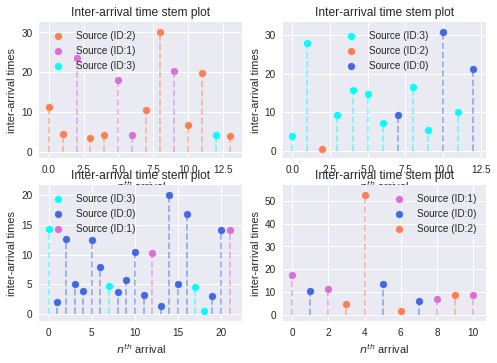

In [3]:
%matplotlib inline  
plt.style.use('seaborn') 
plt.tight_layout()
figure,axes = plt.subplots(2,2)  # 2 x 2 plot
Nrecord.axes = axes[0,0]
Erecord.axes = axes[0,1]
Srecord.axes = axes[1,0]
Wrecord.axes = axes[1,1]
Nrecord.stem_plot()
Erecord.stem_plot()
Srecord.stem_plot()
Wrecord.stem_plot()
plt.show()

## Adding Display 
We will now add display to view progress of the vehicles. It is important to note that display cannot be added afterwards. If one requires a display component then one needs to add it to the simultion from the beginning. Just because a display component has been added does not mean that we need to activate it though and allow it to render vehicles. The display component can be added and the simulation can be run without rendering vehicles on the display components. This saves a lot of time if one would like to populate a simulation or skip the transient phase before viewing the vehicles. The inactive display components will the  just track where they would need to display vehicles without actually displaying or rendering them. Once display is then turned on, vehicles will be rendered at the correct positions. 

For now, we will just run a simulation with display from the beginning. This will also help to illustrate what we mean by the transient phase of the simulation.

**NOTE**: the below script is almost identical to the last script except for a few minor additions. We highlight these few additions with code comment.

Setting up simulation...


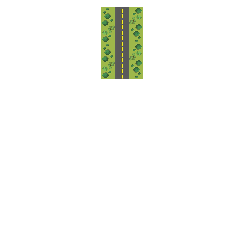

Scheduling Northern arrivals...
..done!
Scheduling Eastern arrivals...
..done!
Scheduling Southern arrivals...
..done!
Scheduling Western arrivals...
..done!


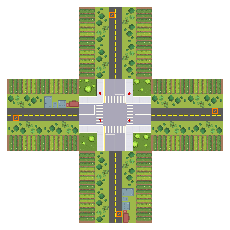

In [4]:

print('Setting up simulation...')
np.random.seed(123)
bk.VehicleDisplay.SHOW = True   # We turn on the display 
bk.VehicleDisplay.speed_up_factor = 10  # make the display attempt to render faster
bk.Vehicle.frames_per_move = 2 # the amount of frames per move. Larger = smoother = slower
fig,ax = bk.axes_grid(3,3,scale=2.5)  # we build a display grid
end_time = 20
lane_length = 5  # SMALL: easier to see in the display.
bk.Queue.clear()
# North:
Nlane_in = bk.Lane(lane_length) 
Nlane_out = bk.Lane(lane_length) 
# NEW:
NDisplay = bk.RoadDisplay(left_lane=Nlane_out,
                          right_lane=Nlane_in,
                          axes=ax[0,1],
                          horizontal=False)
Nrate = {end_time:bk.Rate(0.1)} 
Nsource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Nlane_in.IN,
                    rate_schedule=Nrate)
print('Scheduling Northern arrivals...')
Nsource.setup_arrivals(end_time)
print('..done!')
Nrecord = bk.Record(Nlane_out.OUT)  
# East 
Elane_in = bk.Lane(lane_length) 
Elane_out = bk.Lane(lane_length)
# NEW:
EDisplay = bk.RoadDisplay(left_lane=Elane_out,
                          right_lane=Elane_in,
                          axes=ax[1,2],
                          horizontal=True)
Erate = {end_time:bk.Rate(0.05)} 
Esource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Elane_in.IN,
                    rate_schedule=Erate)
print('Scheduling Eastern arrivals...')
Esource.setup_arrivals(end_time)
print('..done!')
Erecord = bk.Record(Elane_out.OUT)  
# South
Slane_in = bk.Lane(lane_length) 
Slane_out = bk.Lane(lane_length) 
# NEW
SDisplay = bk.RoadDisplay(left_lane=Slane_in,
                          right_lane=Slane_out,
                          axes=ax[2,1],
                          horizontal=False)
Srate = {end_time:bk.Rate(0.1)}
Ssource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Slane_in.IN,
                    rate_schedule=Srate)
print('Scheduling Southern arrivals...')
Ssource.setup_arrivals(end_time)
print('..done!')
Srecord = bk.Record(Slane_out.OUT)  
# West
Wlane_in = bk.Lane(lane_length) 
Wlane_out = bk.Lane(lane_length) 
# NEW
WDisplay = bk.RoadDisplay(left_lane=Wlane_in,
                          right_lane=Wlane_out,
                          axes=ax[1,0],
                          horizontal=True)
Wrate = {end_time:bk.Rate(0.05)} 
Wsource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Wlane_in.IN,
                    rate_schedule=Wrate)
print('Scheduling Western arrivals...')
Wsource.setup_arrivals(end_time)
print('..done!')
Wrecord = bk.Record(Wlane_out.OUT)  
in_nodes = {'N':Nlane_in.OUT,'E':Elane_in.OUT,'S':Slane_in.OUT,'W':Wlane_in.OUT}
out_nodes = {'N':Nlane_out.IN,'E':Elane_out.IN,'S':Slane_out.IN,'W':Wlane_out.IN,}

transitions = {'N': {'E': 0.2, 'S': 0.6, 'W': 0.2},
               'E': {'S': 0.2, 'W': 0.6, 'N': 0.2},
               'S': {'W': 0.2, 'N': 0.6, 'E': 0.2},
               'W': {'N': 0.2, 'E': 0.6, 'S': 0.2}}
stopstreet = bk.StopStreet(in_nodes=in_nodes,
                           out_nodes=out_nodes,
                           transitions=transitions)
# NEW
stopstreetdisplay = bk.StopStreetDisplay(stop_street_object=stopstreet,
                                         show=['N','E','S','W'],
                                         axes=ax[1,1])

# REMOVE for Jupyter Notebook. We will play the video instead.
#bk.Queue.run(end_time=end_time,start_time=0)
#bk.fill_axes_grid(ax)  # OPTIONAL: fills whitespace
fig

## Simulation Videos:
We present two short videos of the same simulation: 
1. Start-up phase and transient behaviour.
2. Populated simulation.
These videos were run using the script found at `/Basik_Tutorial/Console_Scripts/stop_street_tutorial.py`. The script was run in Spyder 4 (Ipython IDE).

#### Video 1: setup phase/transient

In [5]:
from IPython.display import Video
import os
path = os.getcwd()+'/Videos/stop_street_1.mp4'
video_width = 900  # 1024 default
video_height = 450  # 576 default
Video(path,embed=True,width=video_width,height=video_height)

#### Video 2: populated simulation

In [6]:
path = os.getcwd()+'/Videos/stop_street_2.mp4'
video_width = 900  # 1024 default
video_height = 450  # 576 default
Video(path,embed=True,width=video_width,height=video_height)

Notice that placing a record object at a certain node produces an orange camera icon.

## $n$-way stop street ($2\leq  n \leq 4$)
We will configure a 2 way stop street. These are very rare, four-way and three-way (T-junction) are much more common.

Setting up simulation...


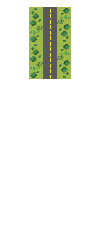

Scheduling Northern arrivals...
..done!
Scheduling Southern arrivals...
..done!


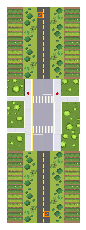

In [9]:
print('Setting up simulation...')
np.random.seed(123)
fig,ax = bk.axes_grid(3,1,scale=1)  
end_time = 20
lane_length = 5  
bk.Queue.clear()
# North:
Nlane_in = bk.Lane(lane_length) 
Nlane_out = bk.Lane(lane_length) 
NDisplay = bk.RoadDisplay(left_lane=Nlane_out,
                          right_lane=Nlane_in,
                          axes=ax[0,0],
                          horizontal=False)
Nrate = {end_time:bk.Rate(2)} 
Nsource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Nlane_in.IN,
                    rate_schedule=Nrate)
print('Scheduling Northern arrivals...')
Nsource.setup_arrivals(end_time)
print('..done!')
Nrecord = bk.Record(Nlane_out.OUT)
# South
Slane_in = bk.Lane(lane_length) 
Slane_out = bk.Lane(lane_length) 
SDisplay = bk.RoadDisplay(left_lane=Slane_in,
                          right_lane=Slane_out,
                          axes=ax[2,0],
                          horizontal=False)
Srate = {end_time:bk.Rate(2)}
Ssource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Slane_in.IN,
                    rate_schedule=Srate)
print('Scheduling Southern arrivals...')
Ssource.setup_arrivals(end_time)
print('..done!')
Srecord = bk.Record(Slane_out.OUT) 
# Stops street
in_nodes = {'N':Nlane_in.OUT,'E':None,'S':Slane_in.OUT,'W':None}
out_nodes = {'N':Nlane_out.IN,'E':None,'S':Slane_out.IN,'W':None}
transitions = {'N': {'E': 0, 'S': 1, 'W': 0}, # IMPORTANT
               'E': {'S': 1, 'W': 0, 'N': 0}, # FICTITIOUS
               'S': {'W': 0, 'N': 1, 'E': 0}, # IMPORTANT
               'W': {'N': 1, 'E': 0, 'S': 0}} # FICTITIOUS
stopstreet = bk.StopStreet(in_nodes=in_nodes,
                           out_nodes=out_nodes,
                           transitions=transitions)
stopstreetdisplay = bk.StopStreetDisplay(stop_street_object=stopstreet,
                                         show=['N','S'],
                                         axes=ax[1,0])
fig

#### Video 3: two-way stop street.

In [10]:
path = os.getcwd()+'/Videos/two_way_stop_street.mp4'
video_width = 900  # 1024 default
video_height = 450  # 576 default
Video(path,embed=True,width=video_width,height=video_height)

## How to populate the simulation **without** rendering display
We will present code that builds a simulation with display components. We will turn off the display, run the simulation, turn the display back on and then continue the simulation as we have done in previous tutorials.

#### Populate simulation by turning off display and running the simulation.

In [11]:
# TURN OFF DISPLAY
bk.VehicleDisplay.SHOW = False 

Setting up simulation...


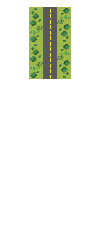

Scheduling Northern arrivals...
..done!
Scheduling Southern arrivals...
..done!
Populating simulation until: 10.0 seconds...
...done!


In [13]:
print('DISPLAY OFF')
print('Setting up simulation...')
np.random.seed(123)
fig,ax = bk.axes_grid(3,1,scale=1)  
end_time = 20
lane_length = 5  
bk.Queue.clear()
# North:
Nlane_in = bk.Lane(lane_length) 
Nlane_out = bk.Lane(lane_length) 
NDisplay = bk.RoadDisplay(left_lane=Nlane_out,
                          right_lane=Nlane_in,
                          axes=ax[0,0],
                          horizontal=False)
Nrate = {end_time:bk.Rate(0.1)} 
Nsource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Nlane_in.IN,
                    rate_schedule=Nrate)
print('Scheduling Northern arrivals...')
Nsource.setup_arrivals(end_time)
print('..done!')
Nrecord = bk.Record(Nlane_out.OUT)
# South
Slane_in = bk.Lane(lane_length) 
Slane_out = bk.Lane(lane_length) 
SDisplay = bk.RoadDisplay(left_lane=Slane_in,
                          right_lane=Slane_out,
                          axes=ax[2,0],
                          horizontal=False)
Srate = {end_time:bk.Rate(0.1)}
Ssource = bk.Source(vehicle_velocity = 16.67,  
                    target_node = Slane_in.IN,
                    rate_schedule=Srate)
print('Scheduling Southern arrivals...')
Ssource.setup_arrivals(end_time)
print('..done!')
Srecord = bk.Record(Slane_out.OUT) 
# Stops street
in_nodes = {'N':Nlane_in.OUT,'E':None,'S':Slane_in.OUT,'W':None}
out_nodes = {'N':Nlane_out.IN,'E':None,'S':Slane_out.IN,'W':None}
transitions = {'N': {'E': 0, 'S': 1, 'W': 0}, # IMPORTANT
               'E': {'S': 1, 'W': 0, 'N': 0}, # FICTITIOUS
               'S': {'W': 0, 'N': 1, 'E': 0}, # IMPORTANT
               'W': {'N': 1, 'E': 0, 'S': 0}} # FICTITIOUS
stopstreet = bk.StopStreet(in_nodes=in_nodes,
                           out_nodes=out_nodes,
                           transitions=transitions)
stopstreetdisplay = bk.StopStreetDisplay(stop_street_object=stopstreet,
                                         show=['N','S'],
                                         axes=ax[1,0])
print('Populating simulation until: {0} seconds...'.format(end_time/2))
bk.Queue.run(end_time/2)
print('...done!')

#### Run simulation with display turned on
We present the code but do not run it as Jupyter Notebook will crash if it produces the display. We comment out the functional code and replace it with a video. The actual code that replicates this can be found at `/Basik_Tutorial/Console_Scripts/populate.py`.

In [14]:
bk.VehicleDisplay.SHOW = True 

In [17]:
for component in bk.Queue.content:
    if isinstance(component,bk.Vehicle):  
        display = component.vehicle_display      
        display.show()
print('DISPLAY ON')
start_time = bk.Queue.current_time
print('Performing simulation with display...')
#bk.Queue.run(end_time=end_time,
#            start_time=start_time)
print('...done!')

DISPLAY ON
Performing simulation with display...
...done!


In [18]:
path = os.getcwd()+'/Videos/populate.mp4'
video_width = 900  # 1024 default
video_height = 450  # 576 default
Video(path,embed=True,width=video_width,height=video_height)

Notice how when the display is turned on, various vehicles appear in their appropriate locations.

# Conclusion/Summary
In this tutorial, we have learned how to use and configure the stop street object. We have also learned how to display the simulation. Various caveats involving the display was discussed. In the next tutorial, we learn how to use traffic circles.